In [1]:
!date

Wed Mar  8 13:34:07 CET 2023


In [2]:
# generation of merged object v3

In [3]:
import numpy as np
import anndata
import pandas as pd
import scanpy as sc
import scipy.sparse

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
from matplotlib import rcParams
sc.set_figure_params(dpi=100) # increase to make the figures bigger
import plotly.tools as tls

import seaborn as sns
sns.set(style="whitegrid")

import collections
import scipy.sparse as sp_sparse
import h5py

In [9]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map='viridis', frameon=False)

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.0 pandas==1.5.0 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [5]:
# import raw data 

plan = 'v6_planula_SUBSET_RAW.h5ad'
plan = sc.read_h5ad(plan)

med = 'medusa_v3_RAW.h5ad'
med = sc.read_h5ad(med)

In [6]:
display(med)
display(plan)

AnnData object with n_obs × n_vars = 25819 × 22683
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'percent_mt2', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mt', 'leiden', 'leiden_1', 'newClusters_1'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_1_colors', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

AnnData object with n_obs × n_vars = 4370 × 23107
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'new_leiden', 'sub_leiden'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'new_leiden_colors', 'paga', 'pca', 'rank_genes_groups', 'sample_colors', 'sub_leiden_colors', 'sub_leiden_sizes', 'umap'
    obsm: 'X_pca', 'X_umap'

# Objects annotation

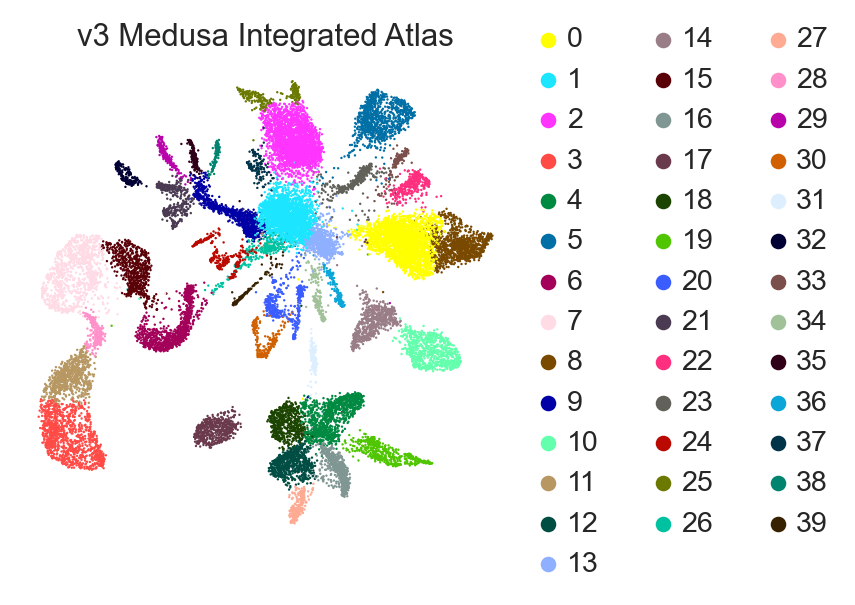

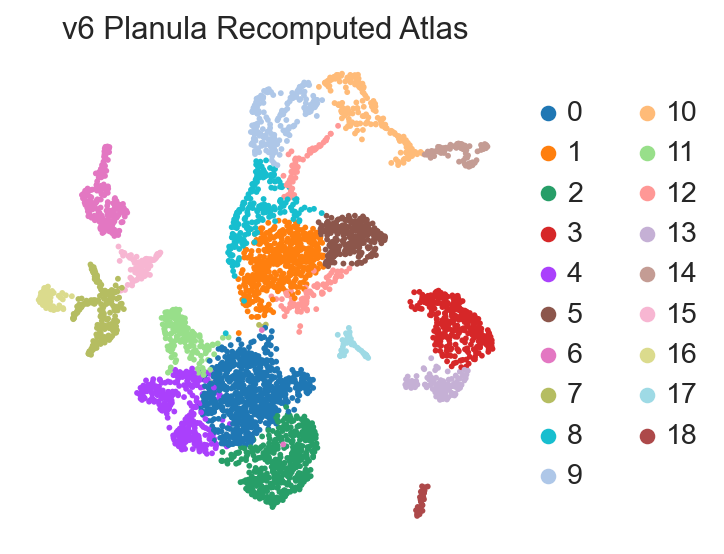

In [10]:
sc.pl.umap(med, color=['leiden'], title='v3 Medusa Integrated Atlas',frameon=False)
sc.pl.umap(plan, color=['sub_leiden'], title="v6 Planula Recomputed Atlas",ncols=1,frameon=False)

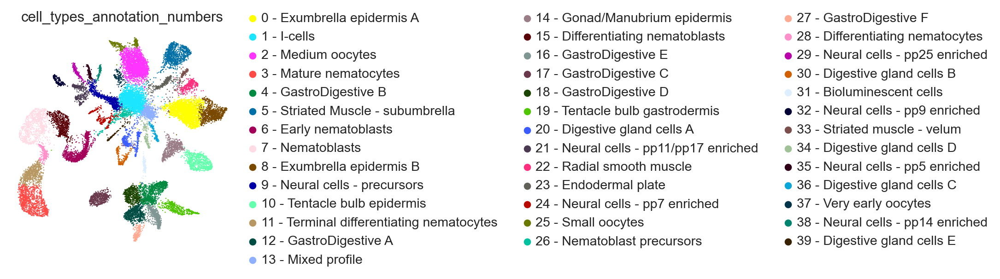

In [11]:
# add labels and colours for medusa

# cell type annotation with leiden numbers
annotation = (
    med.obs['leiden']
    .map(lambda x: {"0": "0 - Exumbrella epidermis A", "1":"1 - I-cells","2": "2 - Medium oocytes", "3":"3 - Mature nematocytes","4":"4 - GastroDigestive B","5":"5 - Striated Muscle - subumbrella","6":"6 - Early nematoblasts","7":"7 - Nematoblasts","8":"8 - Exumbrella epidermis B","9": "9 - Neural cells - precursors", "10":"10 - Tentacle bulb epidermis","11":"11 - Terminal differentiating nematocytes","12":"12 - GastroDigestive A","13":"13 - Mixed profile","14":"14 - Gonad/Manubrium epidermis","15":"15 - Differentiating nematoblasts","16":"16 - GastroDigestive E","17": "17 - GastroDigestive C", "18":"18 - GastroDigestive D","19":"19 - Tentacle bulb gastrodermis","20":"20 - Digestive gland cells A","21":"21 - Neural cells - pp11/pp17 enriched","22":"22 - Radial smooth muscle","23":"23 - Endodermal plate","24":"24 - Neural cells - pp7 enriched","25":"25 - Small oocytes","26":"26 - Nematoblast precursors","27":"27 - GastroDigestive F","28":"28 - Differentiating nematocytes","29":"29 - Neural cells - pp25 enriched","30":"30 - Digestive gland cells B","31":"31 - Bioluminescent cells","32":"32 - Neural cells - pp9 enriched","33":"33 - Striated muscle - velum","34":"34 - Digestive gland cells D","35":"35 - Neural cells - pp5 enriched","36":"36 - Digestive gland cells C","37":"37 - Very early oocytes","38":"38 - Neural cells - pp14 enriched","39":"39 - Digestive gland cells E"}.get(x, x))
    .astype("category")
)

med.obs['medusa_cell_types_annotation_numbers'] = annotation

sc.pl.umap(med, color=['medusa_cell_types_annotation_numbers'],title='cell_types_annotation_numbers' ,ncols=1,frameon=False)

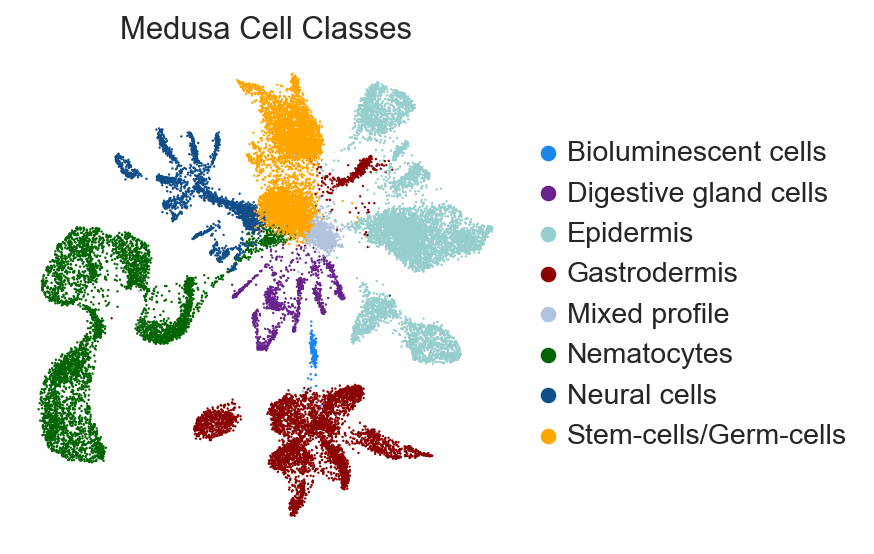

In [12]:
# annotate cell class and add custom colours

annotation = (
    med.obs['leiden']
    .map(lambda x: {"0": "Epidermis", "1":"Stem-cells/Germ-cells","2": "Stem-cells/Germ-cells", "3":"Nematocytes","4":"Gastrodermis","5":"Epidermis","6":"Nematocytes","7":"Nematocytes","8":"Epidermis","9": "Neural cells", "10":"Epidermis","11":"Nematocytes","12":"Gastrodermis","13":"Mixed profile","14":"Epidermis","15":"Nematocytes","16":"Gastrodermis","17": "Gastrodermis", "18":"Gastrodermis","19":"Gastrodermis","20":"Digestive gland cells","21":"Neural cells","22":"Epidermis","23":"Gastrodermis","24":"Neural cells","25":"Stem-cells/Germ-cells","26":"Nematocytes","27":"Gastrodermis","28":"Nematocytes","29":"Neural cells","30":"Digestive gland cells","31":"Bioluminescent cells","32":"Neural cells","33":"Epidermis","34":"Digestive gland cells","35":"Neural cells","36":"Digestive gland cells","37":"Stem-cells/Germ-cells","38":"Neural cells","39":"Digestive gland cells"}.get(x, x))
    .astype("category")
)

med.obs['medusa_cell_class_annotation'] = annotation

colors_anno  = np.array(['#1C86EE','#68228B','#96CDCD','#8B0000', '#B0C4DE','#006400','#104E8B','#FFA500'])
med.uns['medusa_cell_class_annotation_colors'] = colors_anno

sc.pl.umap(med, color=['medusa_cell_class_annotation'], title="Medusa Cell Classes",ncols=1,frameon=False)

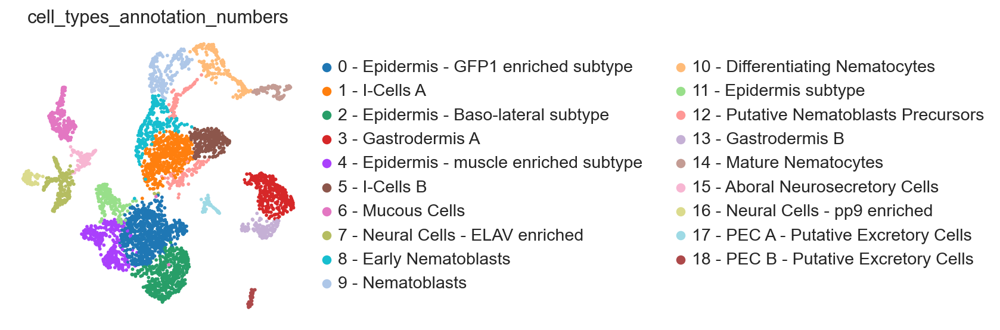

In [13]:
# annotate planula cell types

annotation = (
    plan.obs['sub_leiden']
    .map(lambda x: {"0": "0 - Epidermis - GFP1 enriched subtype", "1":"1 - I-Cells A","2": "2 - Epidermis - Baso-lateral subtype", "3":"3 - Gastrodermis A","4":"4 - Epidermis - muscle enriched subtype","5":"5 - I-Cells B","6":"6 - Mucous Cells","7":"7 - Neural Cells - ELAV enriched","8":"8 - Early Nematoblasts","9": "9 - Nematoblasts", "10":"10 - Differentiating Nematocytes","11":"11 - Epidermis subtype","12":"12 - Putative Nematoblasts Precursors","13":"13 - Gastrodermis B","14":"14 - Mature Nematocytes","15":"15 - Aboral Neurosecretory Cells","16":"16 - Neural Cells - pp9 enriched","17": "17 - PEC A - Putative Excretory Cells", "18":"18 - PEC B - Putative Excretory Cells"}.get(x, x))
    .astype("category")
)

plan.obs['planula_cell_types_annotation_numbers'] = annotation

plan.obs['planula_cell_types_annotation_numbers']

sc.pl.umap(plan,color=['planula_cell_types_annotation_numbers'], title="cell_types_annotation_numbers",ncols=1,frameon=False)

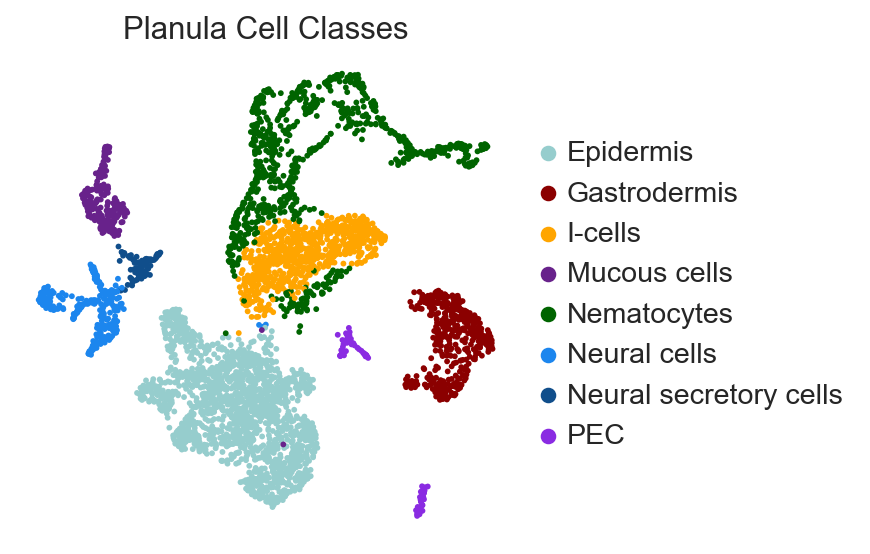

In [14]:
# annotate cell classes

annotation = (
    plan.obs['sub_leiden']
    .map(lambda x: {"0": "Epidermis", "1":"I-cells","2": "Epidermis", "3":"Gastrodermis","4":"Epidermis","5":"I-cells","6":"Mucous cells","7":"Neural cells","8":"Nematocytes","9": "Nematocytes", "10":"Nematocytes","11":"Epidermis","12":"Nematocytes","13":"Gastrodermis","14":"Nematocytes","15":"Neural secretory cells","16":"Neural cells","17": "PEC", "18":"PEC"}.get(x, x))
    .astype("category")
)

plan.obs['planula_cell_class_annotation'] = annotation

# custom colors
colors_anno  = np.array(['#96CDCD','#8B0000','#FFA500','#68228B','#006400','#1C86EE','#104E8B','#8A2BE2'])
plan.uns['planula_cell_class_annotation_colors'] = colors_anno

sc.pl.umap(plan, color=['planula_cell_class_annotation'], title="Planula Cell Classes",ncols=1,frameon=False)

In [15]:
# check if annotations are in place

display(med)
display(plan)

AnnData object with n_obs × n_vars = 25819 × 22683
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'percent_mt2', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mt', 'leiden', 'leiden_1', 'newClusters_1', 'medusa_cell_types_annotation_numbers', 'medusa_cell_class_annotation'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_1_colors', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'sample_colors', 'umap', 'medusa_cell_types_annotation_numbers_colors', 'medusa_cell_class_annotation_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

AnnData object with n_obs × n_vars = 4370 × 23107
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'new_leiden', 'sub_leiden', 'planula_cell_types_annotation_numbers', 'planula_cell_class_annotation'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'new_leiden_colors', 'paga', 'pca', 'rank_genes_groups', 'sample_colors', 'sub_leiden_colors', 'sub_leiden_sizes', 'umap', 'planula_cell_types_annotation_numbers_colors', 'planula_cell_class_annotation_colors'
    obsm: 'X_pca', 'X_umap'

# Apply scVI model and merge

In [30]:
import scvi
scvi.settings.seed = 8924 #setting a random seed

Global seed set to 8924


In [44]:
adata = med.concatenate(plan, join='outer', index_unique='_') 

In [45]:
adata

AnnData object with n_obs × n_vars = 30189 × 24683
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'percent_mt2', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mt', 'leiden', 'leiden_1', 'newClusters_1', 'medusa_cell_types_annotation_numbers', 'medusa_cell_class_annotation', 'new_leiden', 'sub_leiden', 'planula_cell_types_annotation_numbers', 'planula_cell_class_annotation'
    var: 'gene_ids-0', 'feature_types-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_mean_counts-0', 'log1p_total_counts-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_mean_counts-1', 'log1p_total_counts-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_c

In [46]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata  # keep full dimension safe
sc.pp.highly_variable_genes(
    adata, 
    #flavor="seurat_v3", 
    min_mean=0.0125, max_mean=3, min_disp=0.5,  #n_top_genes=2000
    layer="counts", 
    batch_key="sample",
    subset=True
)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [47]:
adata

AnnData object with n_obs × n_vars = 30189 × 2917
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'percent_mt2', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mt', 'leiden', 'leiden_1', 'newClusters_1', 'medusa_cell_types_annotation_numbers', 'medusa_cell_class_annotation', 'new_leiden', 'sub_leiden', 'planula_cell_types_annotation_numbers', 'planula_cell_class_annotation'
    var: 'gene_ids-0', 'feature_types-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_mean_counts-0', 'log1p_total_counts-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_mean_counts-1', 'log1p_total_counts-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_co

In [48]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="sample")#, copy=True)

In [49]:
#vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30)  # getting 40 clusters
#vae = scvi.model.SCVI(adata, n_layers=3, n_latent=50) #v2 # getting 44 clusters
#vae = scvi.model.SCVI(adata, n_layers=2, n_latent=80) # 39 clusters
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30)

In [50]:
vae.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 265/265: 100%|███████████████████████████████████████████████| 265/265 [40:44<00:00,  9.23s/it, loss=430, v_num=1]


In [51]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
adata.obsm["X_normalized_scVI"] = vae.get_normalized_expression()

In [52]:
from scvi.model.utils import mde

In [53]:
# from https://ccbskillssem.github.io/assets/scvi_notebook.html
sc.pp.neighbors(adata, use_rep="X_scVI", metric="correlation")#, n_neighbors=10) #n_neighbors=50, metric="correlation",
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=2.1) #2
sc.tl.umap(adata)#, min_dist=0.4)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 40 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


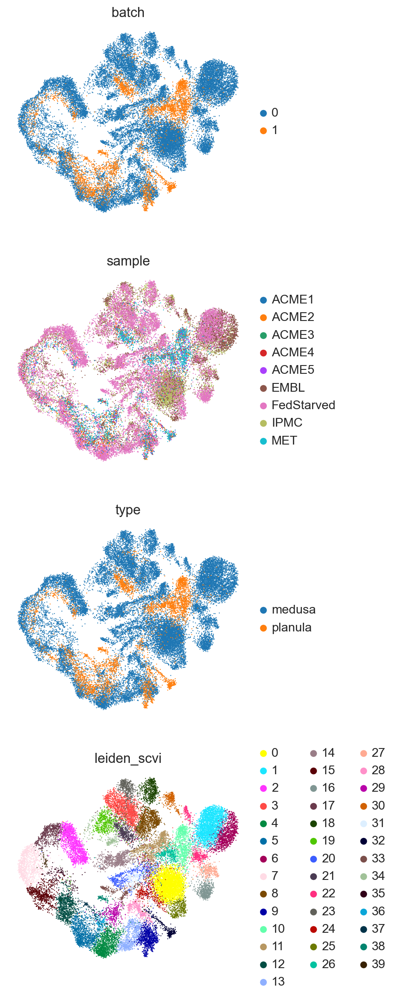

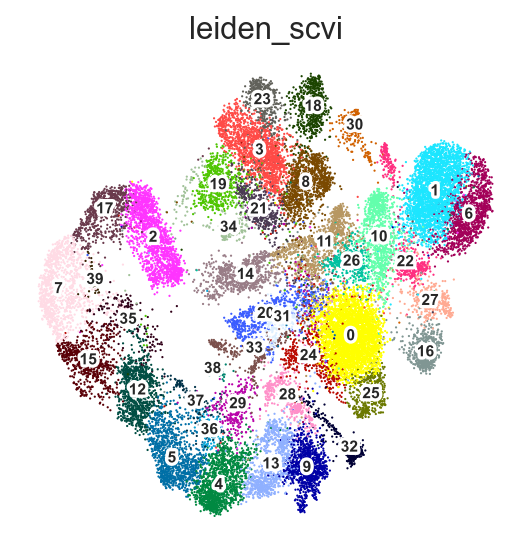

In [54]:
sc.pl.umap(
    adata,
    color=["batch", "sample","type","leiden_scvi"],
    frameon=False,
    ncols=1
)
sc.pl.umap(adata, color=['leiden_scvi'], frameon=False,legend_loc='on data',legend_fontsize=7, legend_fontoutline=3)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


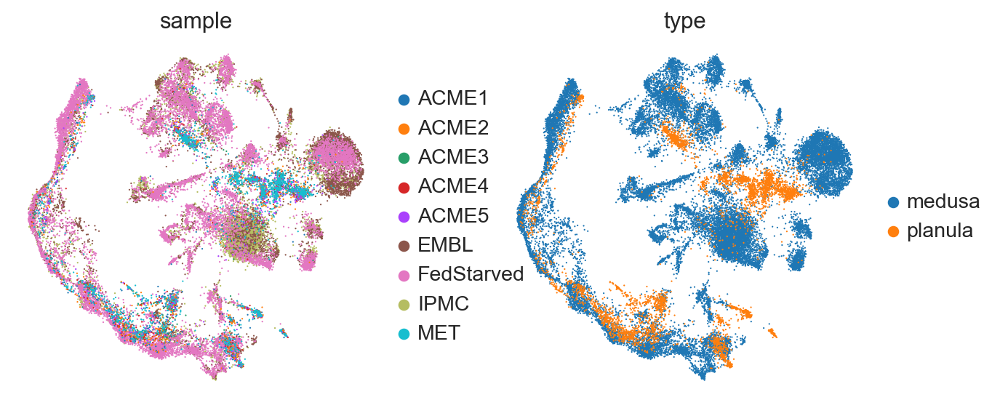

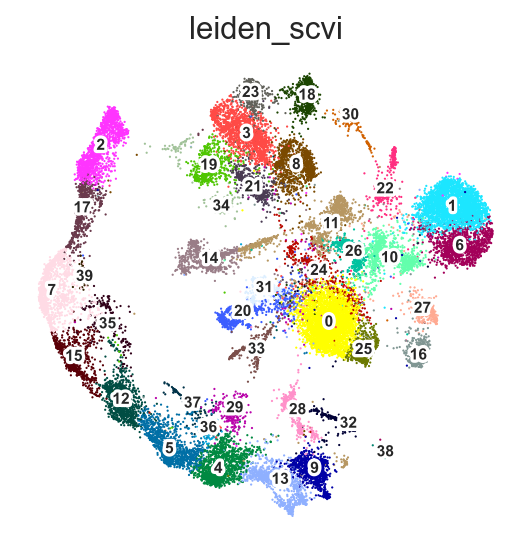

In [55]:
# test embedding
#sc.tl.umap(adata, min_dist=0.2, spread=0.5)
sc.tl.umap(adata, min_dist=0.2, spread=0.8)
sc.pl.umap(adata, color=['sample', 'type'], frameon=False)#,legend_loc='on data',legend_fontsize=7, legend_fontoutline=3))
sc.pl.umap(adata, color=['leiden_scvi'], frameon=False, legend_loc='on data',legend_fontsize=7, legend_fontoutline=3)

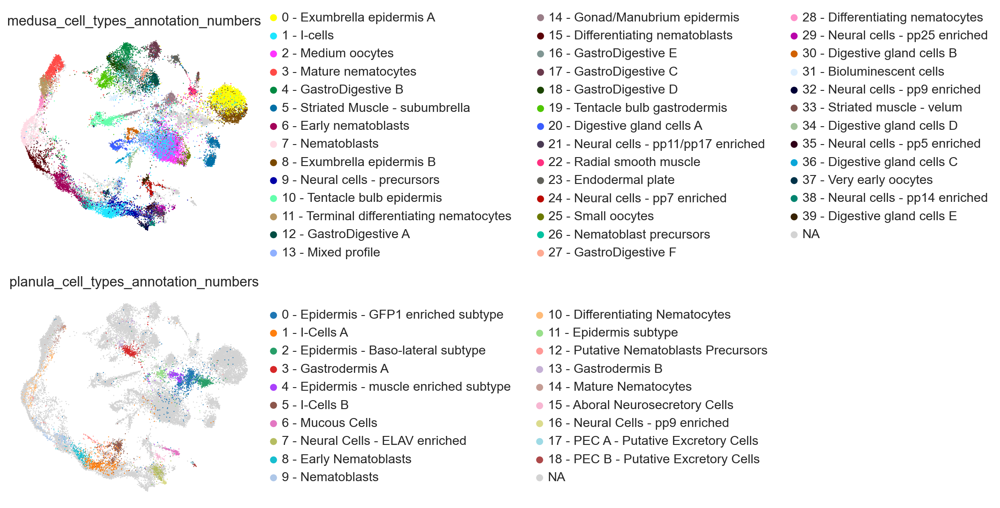

In [56]:
# check cell type annotation
sc.pl.umap(adata,color=['medusa_cell_types_annotation_numbers','planula_cell_types_annotation_numbers'],frameon=False,
    ncols=1)

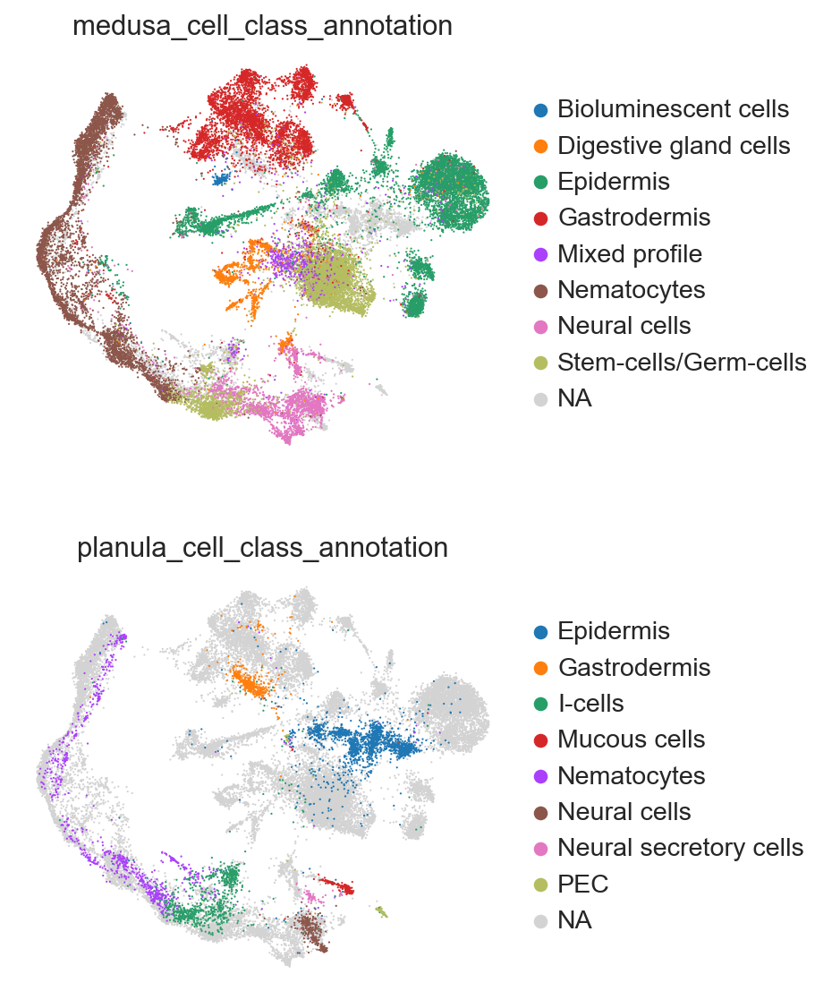

In [57]:
# check cell classes annotation

sc.pl.umap(adata,color=['medusa_cell_class_annotation','planula_cell_class_annotation'],frameon=False,
    ncols=1)

In [58]:
sc.set_figure_params(dpi_save=300, format='pdf')
adata.obs['sample'].groupby(adata.obs['leiden_scvi']).value_counts().unstack().plot(kind='barh',stacked=True,figsize=(80,36))
plt.title('n° of cells per cluster for each batch', fontsize=60)#, fontweight='bold')
plt.xticks(rotation=40, fontsize = 20,horizontalalignment="right",)
plt.xlabel('n° of cells', fontsize=50)
plt.ylabel('Clusters', fontsize=50)

#plt.legend((markers['significant']),loc='upper left',frameon=False,fancybox=True)
plt.legend(bbox_to_anchor=(1.1, 0.1),fontsize=20)
plt.savefig('merged_stacked_batches_hori.pdf', dpi=300,bbox_inches='tight')

plt.show()

In [59]:
sc.set_figure_params(dpi_save=300, format='pdf')
adata.obs['type'].groupby(adata.obs['leiden_scvi']).value_counts().unstack().plot(kind='barh',stacked=True,figsize=(80,36))
plt.title('n° of cells per cluster for each batch', fontsize=60)#, fontweight='bold')
plt.xticks(rotation=40, fontsize = 20,horizontalalignment="right",)
plt.xlabel('n° of cells', fontsize=50)
plt.ylabel('Clusters', fontsize=50)

#plt.legend((markers['significant']),loc='upper left',frameon=False,fancybox=True)
plt.legend(bbox_to_anchor=(1.1, 0.1),fontsize=20)
plt.savefig('merged_stacked_stages_hori.pdf', dpi=300,bbox_inches='tight')

plt.show()

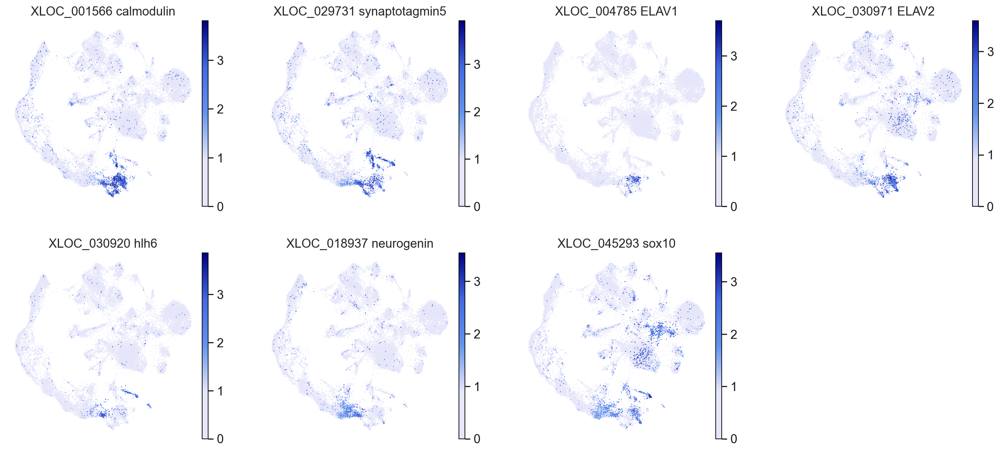

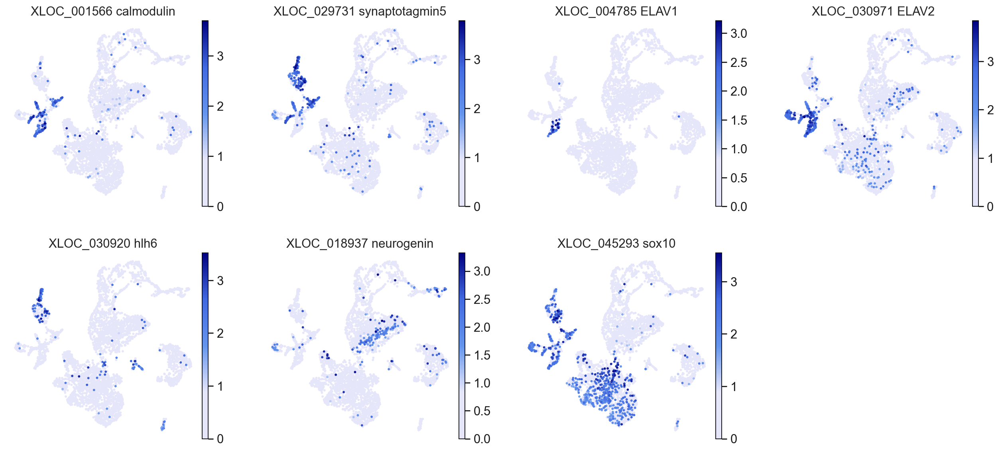

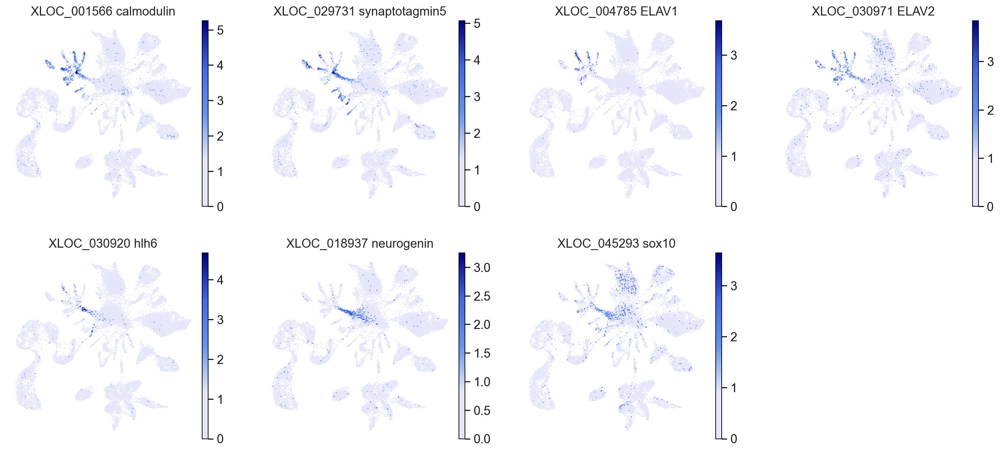

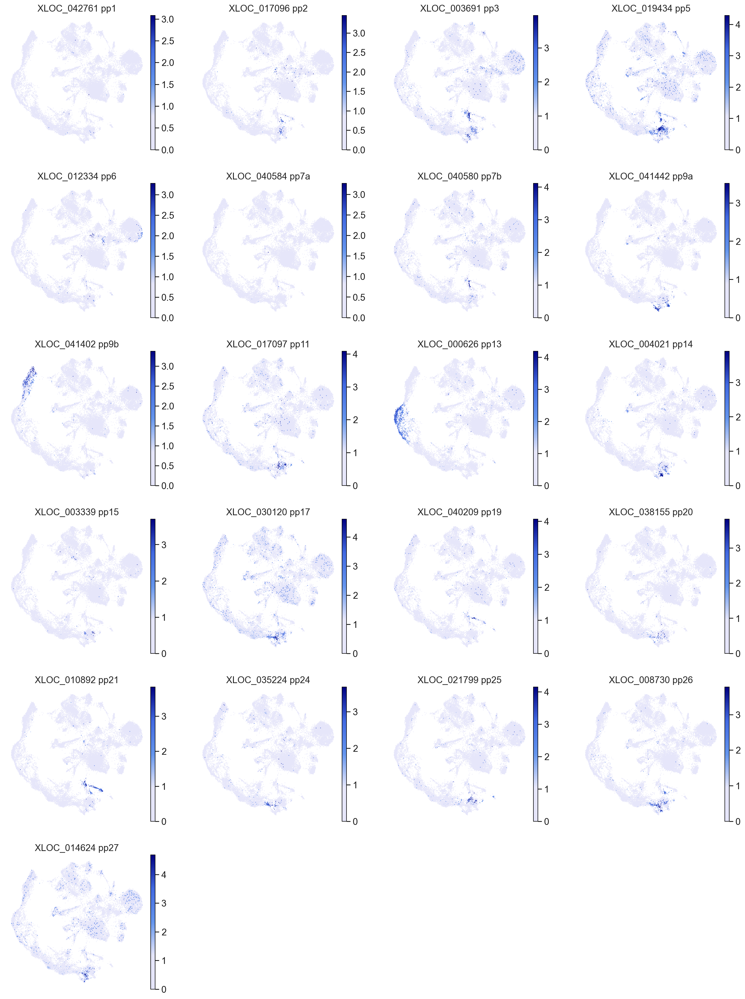

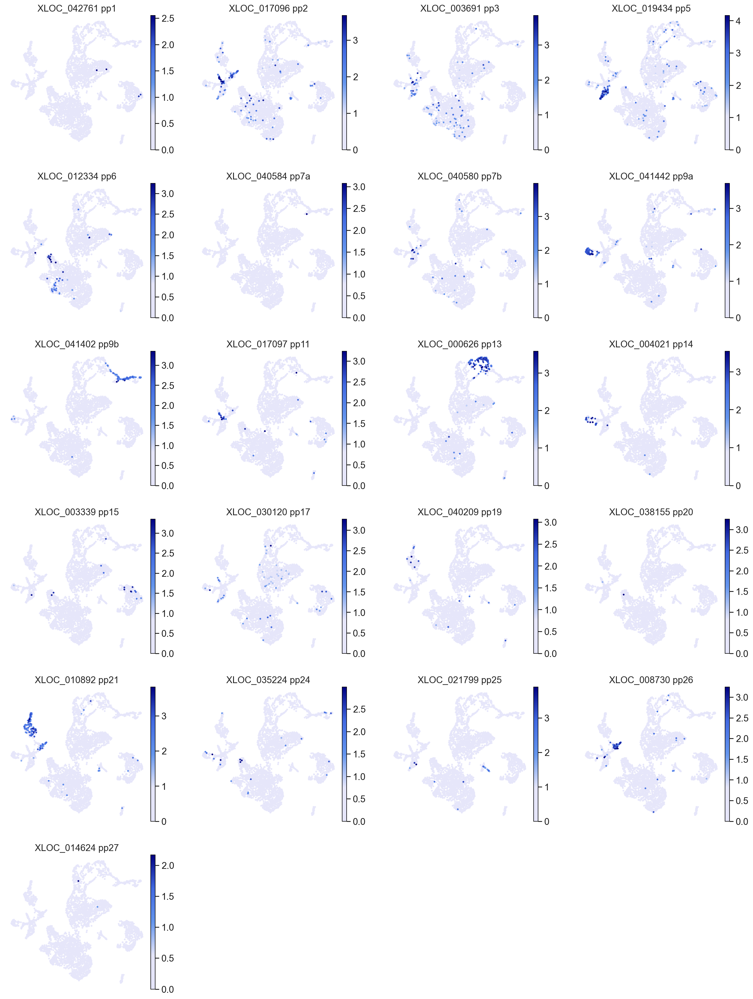

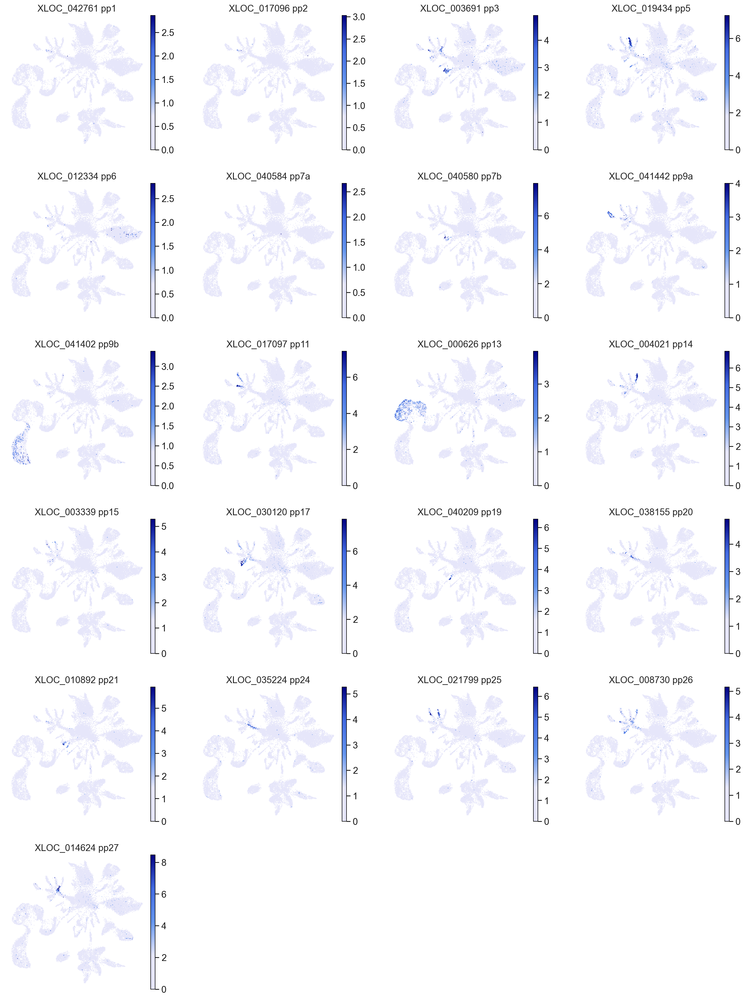

In [65]:
# check neural genes

cmap = sns.blend_palette(["lavender","lavender",'cornflowerblue','royalblue','navy'], 10, as_cmap=True) 
sc.set_figure_params(dpi=80)

# neurons
sc.pl.umap(adata,color=['XLOC_001566','XLOC_029731','XLOC_004785','XLOC_030971','XLOC_030920','XLOC_018937','XLOC_045293'],title=['XLOC_001566 calmodulin','XLOC_029731 synaptotagmin5','XLOC_004785 ELAV1','XLOC_030971 ELAV2','XLOC_030920 hlh6','XLOC_018937 neurogenin','XLOC_045293 sox10'],frameon=False,color_map = cmap)#, save='_merged_neuro_markers_comparison')
sc.pl.umap(plan,color=['XLOC_001566','XLOC_029731','XLOC_004785','XLOC_030971','XLOC_030920','XLOC_018937','XLOC_045293'],title=['XLOC_001566 calmodulin','XLOC_029731 synaptotagmin5','XLOC_004785 ELAV1','XLOC_030971 ELAV2','XLOC_030920 hlh6','XLOC_018937 neurogenin','XLOC_045293 sox10'],frameon=False,color_map = cmap)#, save='_planula_neuro_markers_comparison')
sc.pl.umap(med,color=['XLOC_001566','XLOC_029731','XLOC_004785','XLOC_030971','XLOC_030920','XLOC_018937','XLOC_045293'],title=['XLOC_001566 calmodulin','XLOC_029731 synaptotagmin5','XLOC_004785 ELAV1','XLOC_030971 ELAV2','XLOC_030920 hlh6','XLOC_018937 neurogenin','XLOC_045293 sox10'],frameon=False,color_map = cmap)#, save='_medusa_neuro_markers_comparison')


# neuropeptides
sc.pl.umap(adata,color=['XLOC_042761','XLOC_017096','XLOC_003691','XLOC_019434','XLOC_012334','XLOC_040584','XLOC_040580','XLOC_041442','XLOC_041402','XLOC_017097','XLOC_000626','XLOC_004021','XLOC_003339','XLOC_030120','XLOC_040209','XLOC_038155','XLOC_010892','XLOC_035224','XLOC_021799','XLOC_008730','XLOC_014624'],title=['XLOC_042761 pp1','XLOC_017096 pp2','XLOC_003691 pp3','XLOC_019434 pp5','XLOC_012334 pp6','XLOC_040584 pp7a','XLOC_040580 pp7b','XLOC_041442 pp9a','XLOC_041402 pp9b','XLOC_017097 pp11','XLOC_000626 pp13','XLOC_004021 pp14','XLOC_003339 pp15','XLOC_030120 pp17','XLOC_040209 pp19','XLOC_038155 pp20','XLOC_010892 pp21','XLOC_035224 pp24','XLOC_021799 pp25','XLOC_008730 pp26','XLOC_014624 pp27'],frameon=False,color_map = cmap)#, save='_merged_neuropepti_markers_comparison')
sc.pl.umap(plan,color=['XLOC_042761','XLOC_017096','XLOC_003691','XLOC_019434','XLOC_012334','XLOC_040584','XLOC_040580','XLOC_041442','XLOC_041402','XLOC_017097','XLOC_000626','XLOC_004021','XLOC_003339','XLOC_030120','XLOC_040209','XLOC_038155','XLOC_010892','XLOC_035224','XLOC_021799','XLOC_008730','XLOC_014624'],title=['XLOC_042761 pp1','XLOC_017096 pp2','XLOC_003691 pp3','XLOC_019434 pp5','XLOC_012334 pp6','XLOC_040584 pp7a','XLOC_040580 pp7b','XLOC_041442 pp9a','XLOC_041402 pp9b','XLOC_017097 pp11','XLOC_000626 pp13','XLOC_004021 pp14','XLOC_003339 pp15','XLOC_030120 pp17','XLOC_040209 pp19','XLOC_038155 pp20','XLOC_010892 pp21','XLOC_035224 pp24','XLOC_021799 pp25','XLOC_008730 pp26','XLOC_014624 pp27'],frameon=False,color_map = cmap)#, save='_planula_neuropepti_markers_comparison')
sc.pl.umap(med,color=['XLOC_042761','XLOC_017096','XLOC_003691','XLOC_019434','XLOC_012334','XLOC_040584','XLOC_040580','XLOC_041442','XLOC_041402','XLOC_017097','XLOC_000626','XLOC_004021','XLOC_003339','XLOC_030120','XLOC_040209','XLOC_038155','XLOC_010892','XLOC_035224','XLOC_021799','XLOC_008730','XLOC_014624'],title=['XLOC_042761 pp1','XLOC_017096 pp2','XLOC_003691 pp3','XLOC_019434 pp5','XLOC_012334 pp6','XLOC_040584 pp7a','XLOC_040580 pp7b','XLOC_041442 pp9a','XLOC_041402 pp9b','XLOC_017097 pp11','XLOC_000626 pp13','XLOC_004021 pp14','XLOC_003339 pp15','XLOC_030120 pp17','XLOC_040209 pp19','XLOC_038155 pp20','XLOC_010892 pp21','XLOC_035224 pp24','XLOC_021799 pp25','XLOC_008730 pp26','XLOC_014624 pp27'],frameon=False,color_map = cmap)#, save='_medusa_neuropepti_markers_comparison')


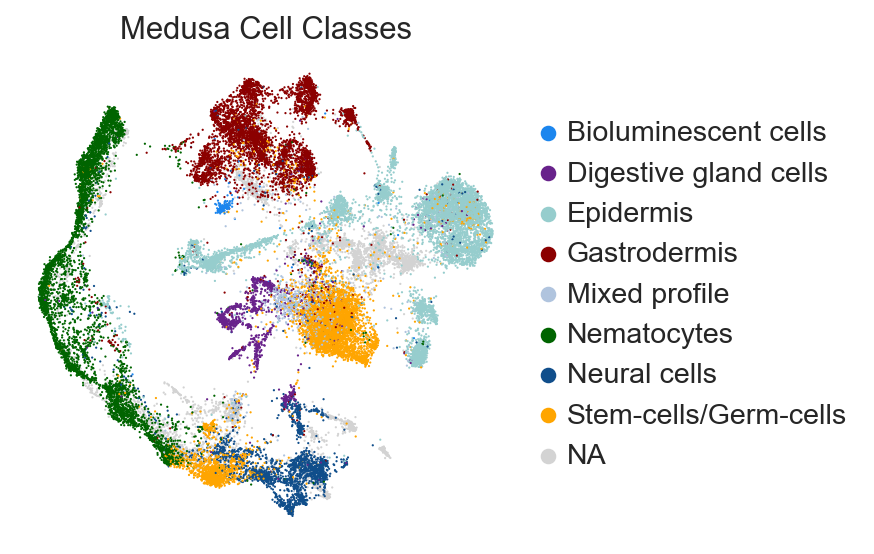

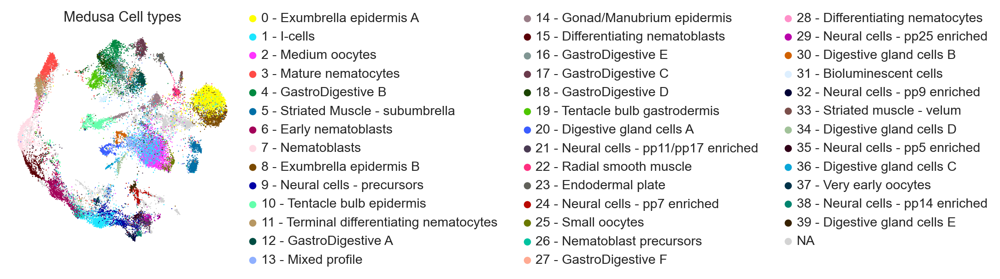

In [66]:
# fix colors annotation classes

#state new colors and check consistency

colors_anno  = np.array(['#1C86EE','#68228B','#96CDCD','#8B0000', '#B0C4DE','#006400','#104E8B','#FFA500'])
adata.uns['medusa_cell_class_annotation_colors'] = colors_anno

sc.pl.umap(adata, color=['medusa_cell_class_annotation'], title="Medusa Cell Classes",ncols=1,frameon=False)#, save='medusa_merged_classes_anno')
sc.pl.umap(adata, color=['medusa_cell_types_annotation_numbers'], title="Medusa Cell types",ncols=1,frameon=False)

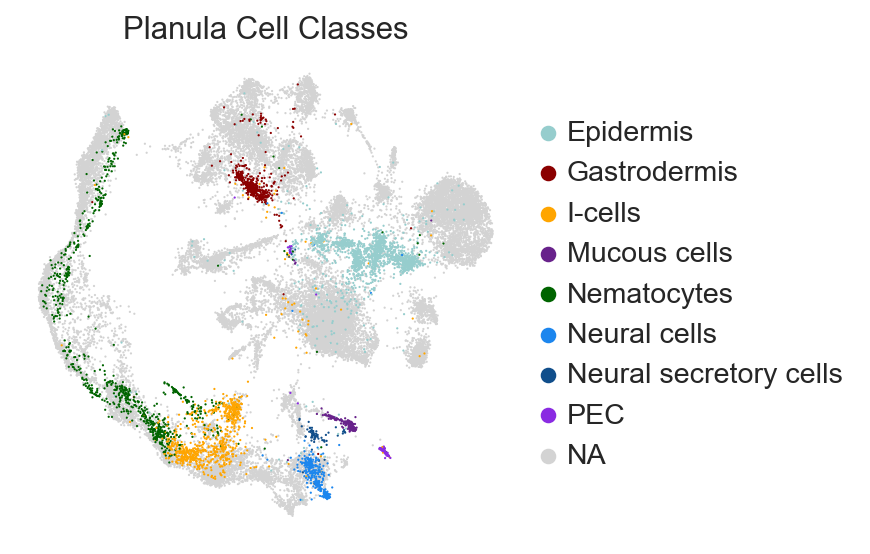

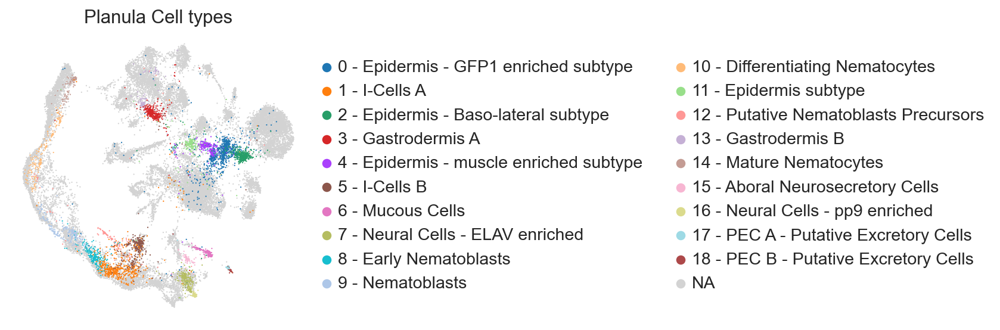

In [67]:
#state new colors and check consistency

colors_anno  = np.array(['#96CDCD','#8B0000','#FFA500','#68228B','#006400','#1C86EE','#104E8B','#8A2BE2'])
adata.uns['planula_cell_class_annotation_colors'] = colors_anno

sc.pl.umap(adata, color=['planula_cell_class_annotation'], title="Planula Cell Classes",ncols=1,frameon=False)#,  save='planula_merged_classes_anno')
sc.pl.umap(adata, color=['planula_cell_types_annotation_numbers'], title="Planula Cell types",ncols=1,frameon=False)

# Save

In [68]:
# to save -> check dtypes in var
adata.var.dtypes

gene_ids-0                      category
feature_types-0                 category
mt-0                              object
n_cells_by_counts-0              float64
mean_counts-0                    float32
pct_dropout_by_counts-0          float64
total_counts-0                   float32
log1p_mean_counts-0              float32
log1p_total_counts-0             float32
n_cells-0                        float64
highly_variable-0                 object
means-0                          float64
dispersions-0                    float64
dispersions_norm-0               float32
gene_ids-1                      category
feature_types-1                 category
mt-1                              object
n_cells_by_counts-1              float64
mean_counts-1                    float32
pct_dropout_by_counts-1          float64
total_counts-1                   float32
log1p_mean_counts-1              float32
log1p_total_counts-1             float32
n_cells-1                        float64
highly_variable-

In [69]:
# convert 'object' to bool
for col in ['mt-0', 'mt-1','highly_variable-1','highly_variable-0']:
    adata.var[col] = adata.var[col].astype('bool')
    
adata.var.dtypes

gene_ids-0                      category
feature_types-0                 category
mt-0                                bool
n_cells_by_counts-0              float64
mean_counts-0                    float32
pct_dropout_by_counts-0          float64
total_counts-0                   float32
log1p_mean_counts-0              float32
log1p_total_counts-0             float32
n_cells-0                        float64
highly_variable-0                   bool
means-0                          float64
dispersions-0                    float64
dispersions_norm-0               float32
gene_ids-1                      category
feature_types-1                 category
mt-1                                bool
n_cells_by_counts-1              float64
mean_counts-1                    float32
pct_dropout_by_counts-1          float64
total_counts-1                   float32
log1p_mean_counts-1              float32
log1p_total_counts-1             float32
n_cells-1                        float64
highly_variable-

In [70]:
# same for raw
adata.raw.var.dtypes

gene_ids-0                   object
feature_types-0            category
mt-0                         object
n_cells_by_counts-0         float64
mean_counts-0               float32
pct_dropout_by_counts-0     float64
total_counts-0              float32
log1p_mean_counts-0         float32
log1p_total_counts-0        float32
n_cells-0                   float64
highly_variable-0            object
means-0                     float64
dispersions-0               float64
dispersions_norm-0          float32
gene_ids-1                   object
feature_types-1            category
mt-1                         object
n_cells_by_counts-1         float64
mean_counts-1               float32
pct_dropout_by_counts-1     float64
total_counts-1              float32
log1p_mean_counts-1         float32
log1p_total_counts-1        float32
n_cells-1                   float64
highly_variable-1            object
means-1                     float64
dispersions-1               float64
dispersions_norm-1          

In [71]:
# convert to bool

for col in ['mt-0', 'mt-1','highly_variable-1','highly_variable-0']:
    adata.raw.var[col] = adata.raw.var[col].astype('bool')
    
adata.raw.var.dtypes

gene_ids-0                   object
feature_types-0            category
mt-0                           bool
n_cells_by_counts-0         float64
mean_counts-0               float32
pct_dropout_by_counts-0     float64
total_counts-0              float32
log1p_mean_counts-0         float32
log1p_total_counts-0        float32
n_cells-0                   float64
highly_variable-0              bool
means-0                     float64
dispersions-0               float64
dispersions_norm-0          float32
gene_ids-1                   object
feature_types-1            category
mt-1                           bool
n_cells_by_counts-1         float64
mean_counts-1               float32
pct_dropout_by_counts-1     float64
total_counts-1              float32
log1p_mean_counts-1         float32
log1p_total_counts-1        float32
n_cells-1                   float64
highly_variable-1              bool
means-1                     float64
dispersions-1               float64
dispersions_norm-1          

In [72]:
# save object

v3medusa_v6planula_merged = 'v3medusa_v6planula_merged_SCVI_v3.h5ad'
adata.write(v3medusa_v6planula_merged)